In [1]:
import matplotlib.pyplot as plt
import numpy as np

from astropy.io import fits
from astropy.wcs import WCS

import sys
sys.path.append("/home/filament/fujimoto/Cygnus-X_CAE/data/process_tools")
from cut_resize_center import *
from Astronomy import *

In [2]:
all_data = np.load("/home/filament/fujimoto/Cygnus-X_CAE/data/zroing_resize_data/resize_data/condition_match/normalize/CygnusX_per_norm_mode_normal_100x100.npy")

In [3]:
hdu = fits.open("/home/filament/fujimoto/Cygnus-X_CAE/fits/Cygnus_sp16_vs-40_ve040_dv0.25_12CO_Tmb.fits")[0]
header = hdu.header
raw_data = hdu.data
wcs = WCS(header)

Changed DATE-OBS from '2016-01-13        ' to '2016-01-13T00:00:00.0''. [astropy.wcs.wcs]


In [4]:
all_data[0].shape[1]
print(all_data.max())

1.0


In [5]:
random_num = sorted(np.random.choice(len(all_data), 20))
print(random_num)

[61, 214, 220, 498, 864, 1575, 2383, 2407, 2579, 2767, 3216, 4364, 4386, 4994, 5005, 5161, 6133, 6868, 6963, 7196]


In [6]:
random_num = [38, 1232, 1788, 2241, 2627, 3840, 4836, 5349, 5389, 5698, 5914, 6253, 6458, 6500, 6537, 6933, 6976, 7581, 7597, 7793]

0.0
1.0


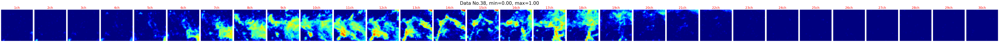

0.0
1.0


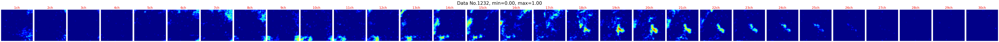

0.0
1.0


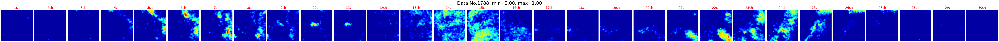

0.0
1.0


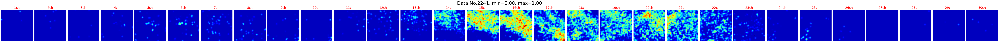

0.0
1.0


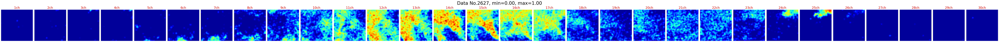

0.0
1.0


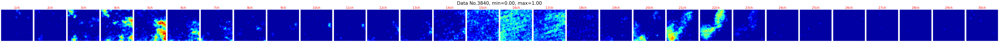

0.0
1.0


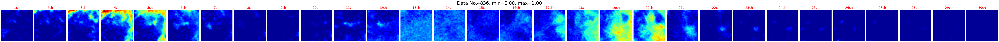

0.0
1.0


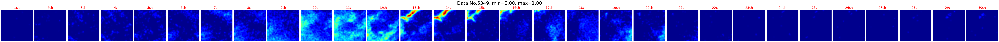

0.0
1.0


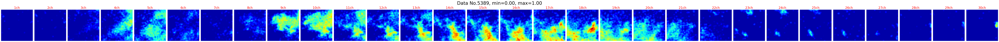

0.0
1.0


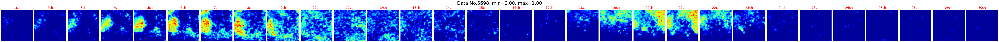

0.0
1.0


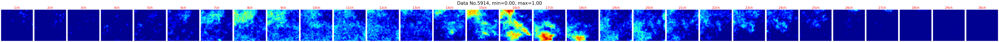

0.0
1.0


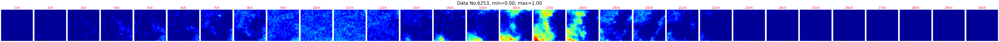

0.0
1.0


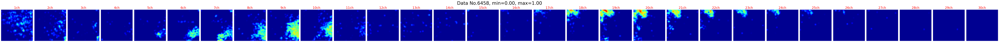

0.0
1.0


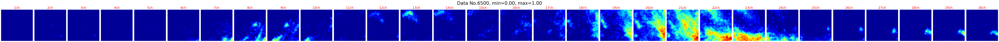

0.0
1.0


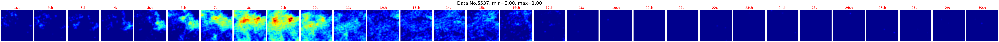

0.0
1.0


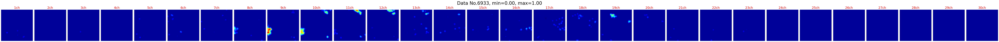

0.0
1.0


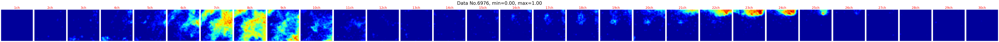

0.0
1.0


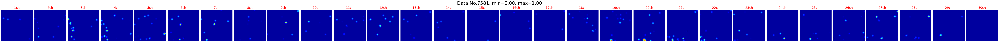

0.0
1.0


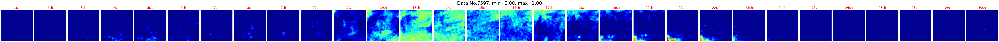

0.0
1.0


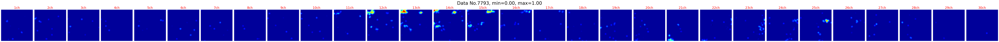

In [7]:
axes_num = all_data.shape[1]

for index in random_num:
    data = all_data[index]
    print(data.min())
    print(data.max())
    
    fig, axes = plt.subplots(1, axes_num, figsize=(axes_num*3, 1*4))
    for j, data_segment in enumerate(data):
        axes[j].imshow(data_segment, vmin=0, vmax=1, cmap="jet")
        axes[j].axis("off")
        axes[j].set_title(f"{j+1}ch", fontsize=20, color='red')

    fig.suptitle(f"Data No.{index}, min={data.min():.2f}, max={data.max():.2f}", fontsize=30) 
    plt.tight_layout()
    plt.savefig(f"per_norm_No{index}.png")
    plt.show()

In [16]:
start = ch2v(0, wcs)
end = ch2v(len(raw_data), wcs)
interval = np.arange(start, end, (end-start)/len(raw_data))

ValueError: x and y must have same first dimension, but have shapes (320,) and (30,)

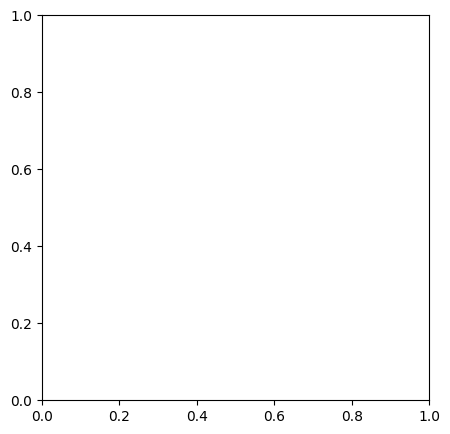

In [24]:
num = 0
data = all_data[num]
mean = np.mean(data, axis=(1, 2))
# max_intens_v = interval[np.argmax(mean)]
# start_v = max_intens_v - width
# end_v = max_intens_v + width
start_v = 121
end_v = 240

fig = plt.figure(figsize=(5,5))
plt.plot(interval, mean, color="k")
plt.title(f"No.{num}, Mean intensity per channel (Size: {data.shape[1]}x{data.shape[1]}pix)")
# ax.set_ylim(0, 12)

plt.axvline(x=start_v, color='blue', linestyle='--', label=f'Range Start ({start_v:.1f} km/s)')
plt.axvline(x=max_intens_v, color='k', linestyle='--', label=f'Peak Velocity ({max_intens_v:.1f} km/s)')
plt.axvline(x=end_v, color='red', linestyle='--', label=f'Range End ({end_v:.1f} km/s)')

plt.xlabel("Velocity [km/s]")
plt.ylabel("Mean Tmb [K]") 
plt.legend(fontsize="small")
plt.grid()
# plt.savefig(f"./select_velocity_plots/width-{width}/No{num}")
plt.show()